<h1 style="text-align: center;"><b>Exploratory analysis of ETH market data</b></h1>

In [1]:
import numpy as np
import pandas as pd
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objs as go

In [3]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Load data

First, let's load the data and look at it.

In [4]:
# I interpret 'LOBS' as 'limit order book stream'.
# I manually removed the column names prefixes and deleted a space before
# the 'exchange_ts' column
lobs_eth = pd.read_csv('../data/1/ethusdt:Binance:LinearPerpetual/lobs.csv')
trades_eth = pd.read_csv('../data/1/ethusdt:Binance:LinearPerpetual/trades.csv')

In [5]:
lobs_eth['receive_ts'] = pd.to_datetime(lobs_eth['receive_ts'])
lobs_eth['exchange_ts'] = pd.to_datetime(lobs_eth['exchange_ts'])
trades_eth['receive_ts'] = pd.to_datetime(trades_eth['receive_ts'])
trades_eth['exchange_ts'] = pd.to_datetime(trades_eth['exchange_ts'])

In [5]:
lobs_eth.head()

,receive_ts,exchange_ts,ask_price_0,ask_vol_0,bid_price_0,bid_vol_0,ask_price_1,ask_vol_1,bid_price_1,bid_vol_1,...,bid_price_7,bid_vol_7,ask_price_8,ask_vol_8,bid_price_8,bid_vol_8,ask_price_9,ask_vol_9,bid_price_9,bid_vol_9
0,2022-06-23 00:00:02.250395360,2022-06-23 00:00:02.249,1049.45,1.046,1049.44,0.782,1049.46,2.229,1049.43,5.0,...,1049.31,7.495,1049.53,2.229,1049.3,1.452,1049.54,27.741,1049.29,2.387
1,2022-06-23 00:00:02.656012600,2022-06-23 00:00:02.655,1049.45,0.314,1049.44,19.860,1049.46,2.243,1049.43,5.0,...,1049.31,7.495,1049.53,2.229,1049.3,1.452,1049.54,27.741,1049.29,2.387
2,2022-06-23 00:00:03.348658915,2022-06-23 00:00:03.348,1049.45,0.314,1049.44,19.860,1049.46,2.243,1049.43,5.0,...,1049.31,7.495,1049.53,2.229,1049.3,1.452,1049.54,27.741,1049.29,2.387
3,2022-06-23 00:00:04.080743828,2022-06-23 00:00:04.080,1049.45,0.314,1049.44,19.860,1049.46,2.243,1049.43,5.0,...,1049.31,7.495,1049.53,2.229,1049.3,1.452,1049.54,27.741,1049.29,2.387
4,2022-06-23 00:00:04.151722232,2022-06-23 00:00:04.151,1049.45,0.314,1049.44,19.860,1049.46,2.243,1049.43,5.0,...,1049.31,7.495,1049.53,2.229,1049.3,1.452,1049.54,27.741,1049.29,2.387


In [6]:
trades_eth.head()

,receive_ts,exchange_ts,aggro_side,price,size
0,2022-06-23 00:00:02.218452815,2022-06-23 00:00:02.217,BID,1049.45,0.062
1,2022-06-23 00:00:02.624182869,2022-06-23 00:00:02.623,BID,1049.45,0.726
2,2022-06-23 00:00:02.624767109,2022-06-23 00:00:02.623,BID,1049.45,0.001
3,2022-06-23 00:00:02.626135583,2022-06-23 00:00:02.623,ASK,1049.44,0.022
4,2022-06-23 00:00:02.627026454,2022-06-23 00:00:02.624,BID,1049.45,0.005


# 1. Plots of best bid/ask levels and trade prices

In [7]:
def plot_history(lobs, trades, start, end, timeline):
    """
    Plot best bid/ask levels and trade prices.
    :param lobs: order book data.
    :param trades: trades data.
    :param start: start time.
    :param end: end time.
    :param timeline: 'receive_ts' or 'exchange_ts'.
    :return: plotly figure object.
    """

    lobs_mask = (lobs[timeline] > start) & (lobs[timeline] < end)
    trades_mask_ask = (trades[timeline] > start) & (trades[timeline] < end) & (trades['aggro_side'] == 'ASK')
    trades_mask_bid = (trades[timeline] > start) & (trades[timeline] < end) & (trades['aggro_side'] == 'BID')

    markers_sell_size = trades['size'][trades_mask_ask] / trades['size'].max() * 300
    markers_sell_size.mask(markers_sell_size < 4, 4, inplace=True)
    markers_buy_size = trades['size'][trades_mask_bid] / trades['size'].max() * 300
    markers_buy_size.mask(markers_buy_size < 4, 4, inplace = True)

    fig = make_subplots(rows=2, cols=1, row_heights=[0.7, 0.3], shared_xaxes=True, vertical_spacing=0.05)

    fig.add_trace(go.Scatter(
            name='Best bid',
            x=lobs[timeline][lobs_mask],
            y=lobs['bid_price_0'][lobs_mask],
            line=dict(color='green'),
            showlegend=True),
        row=1, col=1)

    fig.add_trace(go.Scatter(
            name='Best ask',
            x=lobs[timeline][lobs_mask],
            y=lobs['ask_price_0'][lobs_mask],
            line=dict(color='red'),
            showlegend=True),
        row=1, col=1)

    fig.add_trace(go.Scatter(
            name='Best bid 9',
            x=lobs[timeline][lobs_mask],
            y=lobs['bid_price_9'][lobs_mask],
            line=dict(color='darkgreen'),
            showlegend=True),
        row=1, col=1)

    fig.add_trace(go.Scatter(
            name='Best ask 9',
            x=lobs[timeline][lobs_mask],
            y=lobs['ask_price_9'][lobs_mask],
            line=dict(color='darkred'),
            showlegend=True),
        row=1, col=1)

    fig.add_trace(go.Scatter(
            name='Buy trade',
            x=trades[timeline][trades_mask_bid],
            y=trades['price'][trades_mask_bid],
            mode='markers',
            marker_size=markers_buy_size,
            marker_symbol='arrow-up-open',
            line=dict(color='blue', width=7),
            showlegend=True),
        row=1, col=1)

    fig.add_trace(go.Scatter(
            name='Sell trade',
            x=trades[timeline][trades_mask_ask],
            y=trades['price'][trades_mask_ask],
            mode='markers',
            line=dict(color='crimson'),
            marker_symbol='arrow-down-open',
            marker_size=markers_sell_size,
            showlegend=True),
        row=1, col=1)

    time_diff = (lobs[timeline][lobs_mask] - lobs[timeline][lobs_mask].shift()) / 10 ** 6
    fig.add_trace(go.Line(
            name='Time difference',
            y=time_diff,
            x=lobs[timeline][lobs_mask],
            showlegend=True
            ),
        row=2, col=1)

    fig.update_layout(xaxis2_title='Time', yaxis1_title='Price', yaxis2_title='Time difference, ms', title=f'Timeline: {timeline}')
    return fig

First of all, data point #158801 (a sell trade) in the trades data is probably an anomaly, because the price is significantly higher than the bid/ask levels near that moment of time, and the time lag is normal. Thus, I remove it from the data.

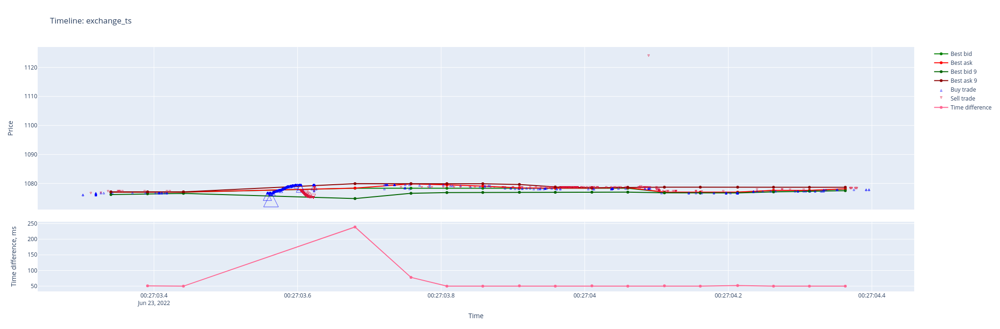

In [8]:
%%capture --no-display
start = '2022-06-23 00:27:03.300'
end = '2022-06-23 00:27:04.400'
fig = plot_history(lobs_eth, trades_eth, start, end, timeline='exchange_ts');
fig.update_layout(width=1000, height=700).show();

In [9]:
trades_eth.drop([0, 158801], inplace=True);

Now let's look at the plots.

In [ ]:
%%capture --no-display
start = '2022-06-23 00:26:00'
end = '2022-06-23 00:30:00'
plot_history(lobs_eth, trades_eth, start, end, timeline='receive_ts').show(renderer='browser');
plot_history(lobs_eth, trades_eth, start, end, timeline='exchange_ts').show(renderer='browser');

![lobs-trades-plot.png](pics/eth/lobs-trades-plot.png)

The legend can be found in the top right corner of a plot. The triangle size indicates the size of a trade.

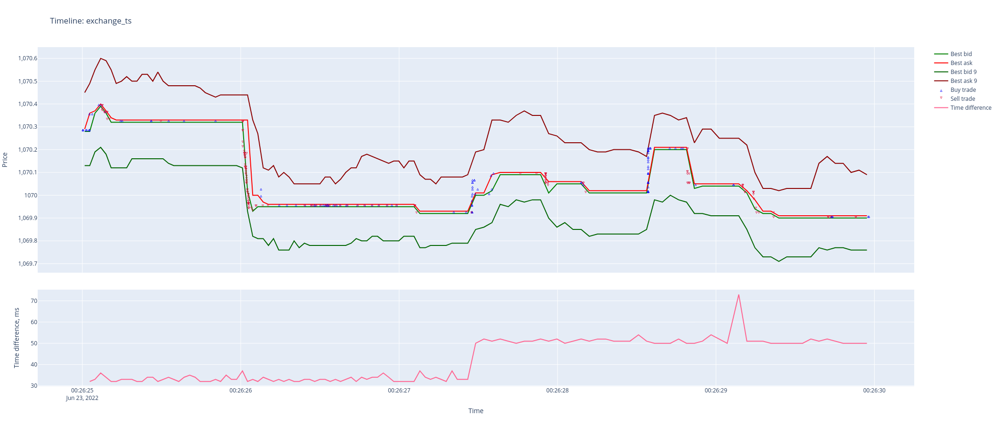

In [11]:
%%capture --no-display
start = '2022-06-23 00:26:25'
end = '2022-06-23 00:26:30'
fig = plot_history(lobs_eth, trades_eth, start, end, timeline='exchange_ts');
fig.update_layout(width=1300, height=900).show();

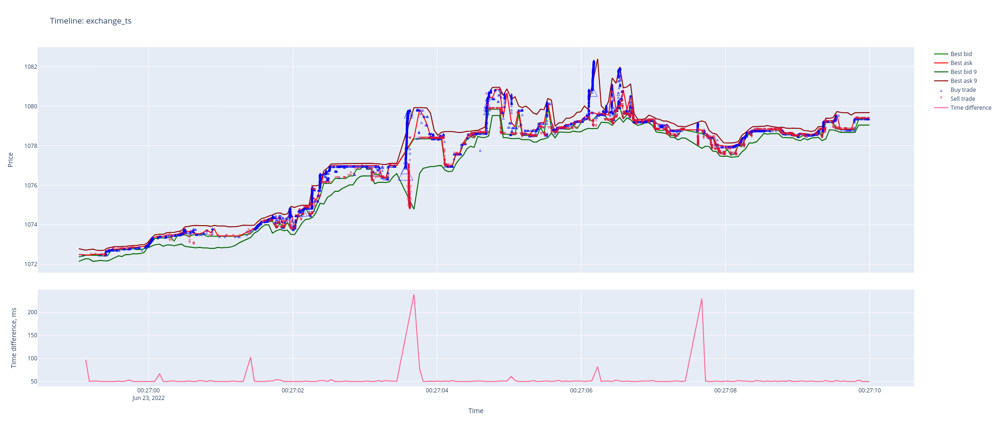

In [12]:
%%capture --no-display
start = '2022-06-23 00:26:59'
end = '2022-06-23 00:27:10'
fig = plot_history(lobs_eth, trades_eth, start, end, timeline='exchange_ts');
fig.update_layout(width=1300, height=900).show();

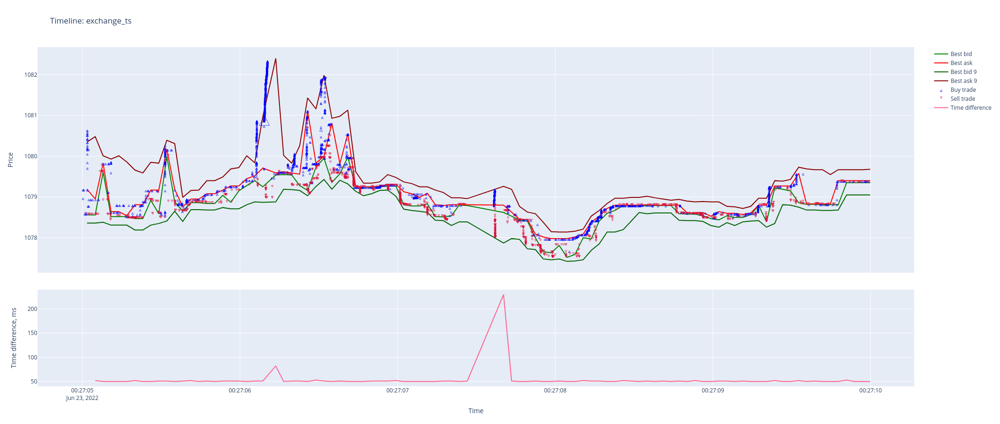

In [13]:
%%capture --no-display
start = '2022-06-23 00:27:05'
end = '2022-06-23 00:27:10'
fig = plot_history(lobs_eth, trades_eth, start, end, timeline='exchange_ts');
fig.update_layout(width=1300, height=900).show();

## Time difference between the nearest order book data points on the exchange timeline

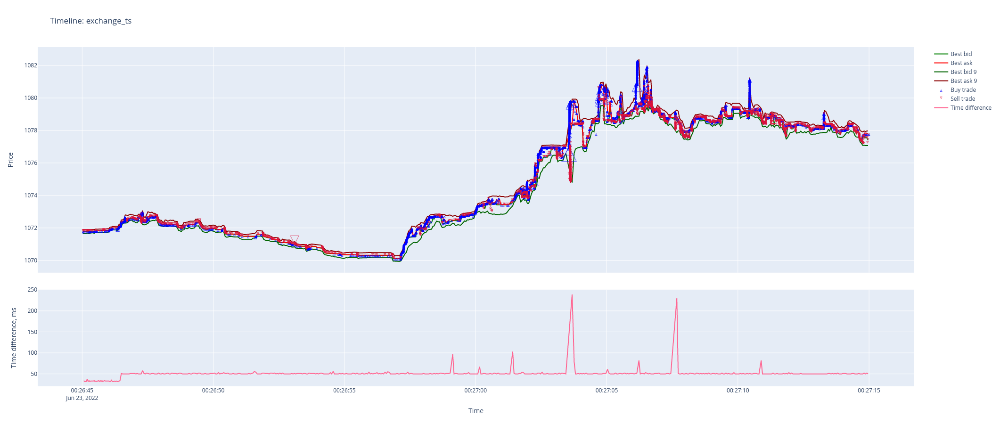

In [14]:
%%capture --no-display
start = '2022-06-23 00:26:45'
end = '2022-06-23 00:27:15'
fig = plot_history(lobs_eth, trades_eth, start, end, timeline='exchange_ts');
fig.update_layout(width=1300, height=900).show();

Let's look at the median value and different quantiles.

In [15]:
print('Median exchange time difference between order book data points: ', end='')
print((lobs_eth['exchange_ts'] - lobs_eth['exchange_ts'].shift()).median())

Median exchange time difference between order book data points: 0 days 00:00:00.033000


In [16]:
quantiles = []
for i, q in enumerate(range(5, 100, 5)):
    quantiles.append((lobs_eth['exchange_ts'] - lobs_eth['exchange_ts'].shift()).quantile(q * 0.01))
    print(f'{q}% quantile:', quantiles[-1])

quantiles.append((lobs_eth['exchange_ts'] - lobs_eth['exchange_ts'].shift()).quantile(0.99))
print(f'99% quantile:', quantiles[-1])

5% quantile: 0 days 00:00:00.032000
10% quantile: 0 days 00:00:00.032000
15% quantile: 0 days 00:00:00.032000
20% quantile: 0 days 00:00:00.032000
25% quantile: 0 days 00:00:00.032000
30% quantile: 0 days 00:00:00.032000
35% quantile: 0 days 00:00:00.033000
40% quantile: 0 days 00:00:00.033000
45% quantile: 0 days 00:00:00.033000
50% quantile: 0 days 00:00:00.033000
55% quantile: 0 days 00:00:00.033000
60% quantile: 0 days 00:00:00.033000
65% quantile: 0 days 00:00:00.034000
70% quantile: 0 days 00:00:00.034000
75% quantile: 0 days 00:00:00.034000
80% quantile: 0 days 00:00:00.034000
85% quantile: 0 days 00:00:00.035000
90% quantile: 0 days 00:00:00.036000
95% quantile: 0 days 00:00:00.039000
99% quantile: 0 days 00:00:00.052000


If we look at the minimum and maximum values of time difference, seems like they are located close to each other on the timeline.

### The interval with a glitch

In [17]:
(lobs_eth['exchange_ts'] - lobs_eth['exchange_ts'].shift()).nsmallest()

1692667   0 days 00:00:00.004000
1692668   0 days 00:00:00.004000
1692674   0 days 00:00:00.004000
1692686   0 days 00:00:00.004000
1692689   0 days 00:00:00.004000
Name: exchange_ts, dtype: timedelta64[ns]

In [18]:
(lobs_eth['exchange_ts'] - lobs_eth['exchange_ts'].shift()).nlargest()

1692649   0 days 00:00:01.571000
1692659   0 days 00:00:01.451000
1692660   0 days 00:00:01.245000
1692661   0 days 00:00:01.240000
849191    0 days 00:00:01.148000
Name: exchange_ts, dtype: timedelta64[ns]

In [19]:
lobs_eth['exchange_ts'].iloc[1693280]

Timestamp('2022-06-23 16:00:20.704000')

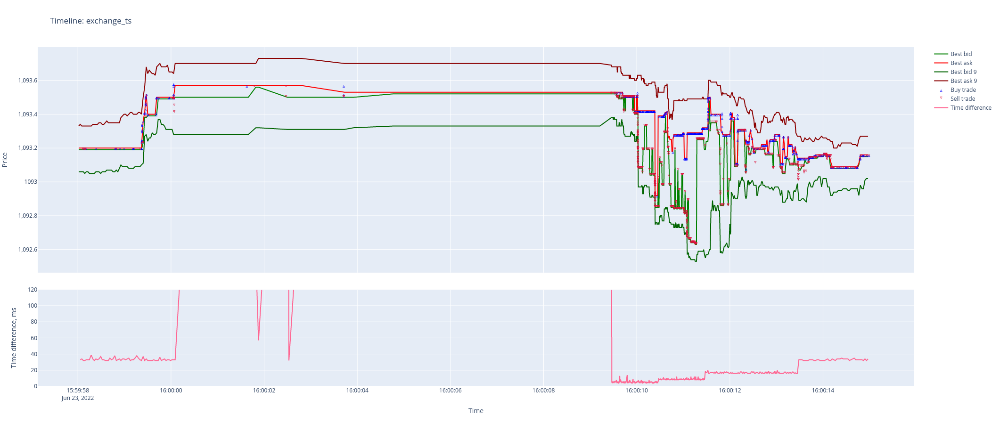

In [20]:
%%capture --no-display
start = '2022-06-23 15:59:58'
end = '2022-06-23 16:00:15'
fig = plot_history(lobs_eth, trades_eth, start, end, timeline='exchange_ts');
fig.update_layout(width=1300, height=900)
fig['layout']['yaxis2'].update(range=[0, 120])
fig.show()

Same behaviour as for BTC.

# 2. Statistics

## Trade size

### Quantiles

In [21]:
trades_quantiles = []
for i, q in enumerate(range(5, 100, 5)):
    trades_quantiles.append(trades_eth['size'].quantile(q * 0.01))
    print(f'{q}% quantile:', trades_quantiles[-1])

5% quantile: 0.005
10% quantile: 0.005
15% quantile: 0.005
20% quantile: 0.005
25% quantile: 0.011
30% quantile: 0.013
35% quantile: 0.024
40% quantile: 0.049
45% quantile: 0.091
50% quantile: 0.153
55% quantile: 0.233
60% quantile: 0.348
65% quantile: 0.5
70% quantile: 0.661
75% quantile: 0.988
80% quantile: 1.344
85% quantile: 1.873
90% quantile: 3.101
95% quantile: 5.0


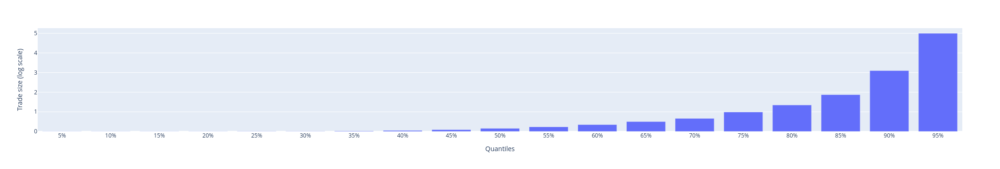

In [22]:
fig = px.bar(trades_quantiles)
fig.update_layout(xaxis=dict(tickmode='array', tickvals=list(range(len(trades_quantiles))), ticktext=[f'{q}%' for q in range(5, 100, 5)]))
fig.update_layout(xaxis_title='Quantiles', yaxis_title='Trade size (log scale)', showlegend=False)
fig.show()

The majority of trades have small volume.

### Median, mean, variance

In [23]:
trades_median = trades_eth['size'].median()
trades_mean = trades_eth['size'].mean()
trades_var = trades_eth['size'].var()
trades_std = np.sqrt(trades_var)

In [24]:
print('Median:', str(trades_median)[:7])
print('Mean:', str(trades_mean)[:7])
print('Variance:', str(trades_var)[:7])
print('Std. dev.:', str(trades_std)[:7])

Median: 0.153
Mean: 1.21987
Variance: 40.1174
Std. dev.: 6.33383


# 3. Histograms

## Trade size

In [ ]:
fig = px.histogram(trades_eth, x='size')
fig.update_xaxes(range=[0, 2.5])
fig.update_yaxes(range=[0, 400000])
fig.update_layout(width=1300, height=900)
fig.show(renderer='browser')

![trade-size-histogram.png](pics/eth/trade-size-histogram.png)

## Bid/ask levels

We will look at the best 5 levels.

In [26]:
lobs_cum_eth = lobs_eth.copy()

# drop columns with price information
for i in range(10):
    lobs_cum_eth.drop([f'ask_price_{i}', f'bid_price_{i}'], axis=1, inplace=True)

# drop unnecessary price levels
for i in range(5, 9+1):
    lobs_cum_eth.drop([f'ask_vol_{i}', f'bid_vol_{i}'], axis=1, inplace=True)

# calculate cumulative volume
for i in range(1, 4+1):
    lobs_cum_eth[f'ask_vol_{i}'] = lobs_cum_eth[f'ask_vol_{i}'].add(lobs_cum_eth[f'ask_vol_{i - 1}'])
    lobs_cum_eth[f'bid_vol_{i}'] = lobs_cum_eth[f'bid_vol_{i}'].add(lobs_cum_eth[f'bid_vol_{i - 1}'])

In [ ]:
for i in range(4+1):
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=lobs_cum_eth[f'ask_vol_{i}'], name=f'ask_vol_{i} (cumul)'))
    fig.add_trace(go.Histogram(x=lobs_cum_eth[f'bid_vol_{i}'], name=f'bid_vol_{i} (cumul)'))
    fig.update_layout(barmode='overlay', xaxis_title='Trade volume', yaxis_title='Count')
    fig.update_traces(opacity=0.75)
    fig.update_xaxes(range=[0, 100])
    fig.update_layout(width=1100, height=600)
    fig.show(renderer='browser')

![bid-ask-0-vol-cumul-hist.png](pics/eth/bid-ask-0-vol-cumul-hist.png)

![bid-ask-1-vol-cumul-hist.png](pics/eth/bid-ask-1-vol-cumul-hist.png)

![bid-ask-2-vol-cumul-hist.png](pics/eth/bid-ask-2-vol-cumul-hist.png)

![bid-ask-3-vol-cumul-hist.png](pics/eth/bid-ask-3-vol-cumul-hist.png)

![bid-ask-4-vol-cumul-hist.png](pics/eth/bid-ask-4-vol-cumul-hist.png)

The histograms are similar to the BTC histograms of bid/ask levels. However, there is a small difference: ETH histograms have a little bump in the trade volume range starting approximately from 7 to 15 and ending at 25 to 40.

# 4. Dependence of the best ask/bid price change on the trade size

Every trade in our data is a match between a taker order or its part and a maker order or its part. Therefore, it is more correct to say that the market taking *order* pierces the order book, not the trade. But we do not have the data about the actual orders, so we can only make assumptions that the taker order was executed. One way to do this is to assume that the sequence of trades that have the same timestamp on the exchange timeline is caused by a single taker order.

Having that established, there are two ways to calculate the change of the best price caused by that taker order:
1. difference between the price of the last and the first trade in a sequence;
2. difference between the closest best ask (bid) price that preceds the first trade from a sequence, and the closest best ask (bid) price after the last trade from a sequence.

The disadvantage of the second approach is that the time difference between the order book datapoints is relatively high compared to the time difference between the trades. Also, as described above, time difference between the order book datapoints can increase several times when the trading activity is high. For that reason, I will use the first approach.

In [28]:
trades_eth.head()

,receive_ts,exchange_ts,aggro_side,price,size
1,2022-06-23 00:00:02.624182869,2022-06-23 00:00:02.623,BID,1049.45,0.726
2,2022-06-23 00:00:02.624767109,2022-06-23 00:00:02.623,BID,1049.45,0.001
3,2022-06-23 00:00:02.626135583,2022-06-23 00:00:02.623,ASK,1049.44,0.022
4,2022-06-23 00:00:02.627026454,2022-06-23 00:00:02.624,BID,1049.45,0.005
5,2022-06-23 00:00:09.188981790,2022-06-23 00:00:09.188,BID,1049.45,0.005


In [6]:
trades_agg_eth = trades_eth.drop(['receive_ts'], axis=1)\
    .groupby(['exchange_ts', 'aggro_side'])\
    .agg({'price': ['first', 'last'], 'size': 'sum'})

trades_agg_eth.columns = trades_agg_eth.columns.map('_'.join)  # flatten MultiIndex
trades_agg_eth['price_change'] = trades_agg_eth.pop('price_last') - trades_agg_eth.pop('price_first')
trades_agg_eth = trades_agg_eth.groupby('aggro_side')

trades_agg_bid_eth = trades_agg_eth.get_group('BID').copy()
trades_agg_ask_eth = trades_agg_eth.get_group('ASK').copy()
trades_agg_bid_eth.size_sum = (trades_agg_bid_eth.size_sum * 1000).round().astype(int)
trades_agg_ask_eth.size_sum = (trades_agg_ask_eth.size_sum * 1000).round().astype(int)

lob_pierces_bid = trades_agg_bid_eth.groupby('size_sum').agg('mean')
lob_pierces_ask = trades_agg_ask_eth.groupby('size_sum').agg('mean')

In [7]:
lob_pierces_bid = lob_pierces_bid[lob_pierces_bid.price_change >= 0]
lob_pierces_ask = lob_pierces_ask[lob_pierces_ask.price_change <= 0]

Let's look at the plots.

In [10]:
%%capture --no-display
fig = go.Figure(go.Line(
    x = lob_pierces_bid.index * 0.001,
    y = lob_pierces_bid['price_change'],
    hovertemplate = 'Order size: %{x}<br>Price change: %{y}<extra></extra>'
))
fig.update_layout(xaxis_title='Deduced order size', yaxis_title='Mean price change',
                  title='Dependence of the best ask price change on the executed order size',
                  showlegend=False)
fig.show(renderer='browser')

Opening in existing browser session.


[9416:9452:0927/194316.070686:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")
[9416:9452:0927/194316.070739:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")


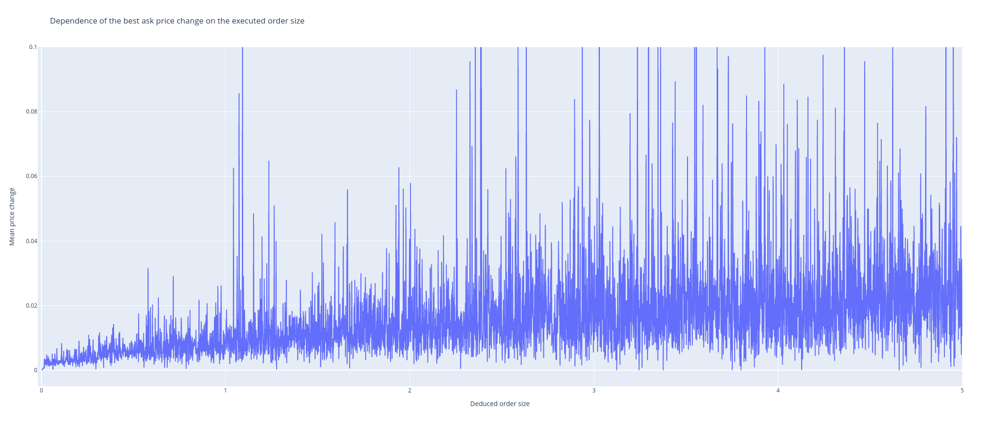

In [35]:
%%capture --no-display
fig = go.Figure(go.Line(
    x = lob_pierces_bid.index * 0.001,
    y = lob_pierces_bid['price_change'],
    hovertemplate = 'Order size: %{x}<br>Price change: %{y}<extra></extra>'
))
fig.update_layout(xaxis_title='Deduced order size', yaxis_title='Mean price change',
                  title='Dependence of the best ask price change on the executed order size',
                  width=1300, height=900, showlegend=False)
fig.update_xaxes(range=[-0.02, 5])
fig.update_yaxes(range=[-0.005, 0.1])

In [11]:
%%capture --no-display
fig = go.Figure(go.Line(
    x = lob_pierces_ask.index * 0.001,
    y = lob_pierces_ask['price_change']*-1,
    line=dict(color='red'),
    hovertemplate = 'Order size: %{x}<br>Price change: %{y}<extra></extra>'
))
fig.update_layout(xaxis_title='Deduced order size', yaxis_title='-1 * Mean price change',
                  title='Dependence of the best ask price change on the executed order size',
                  showlegend=False)
fig.show(renderer='browser')

Opening in existing browser session.


[15717:15741:0927/195105.499451:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")
[15717:15741:0927/195105.499503:ERROR:bus.cc(399)] Failed to connect to the bus: Could not parse server address: Unknown address type (examples of valid types are "tcp" and on UNIX "unix")


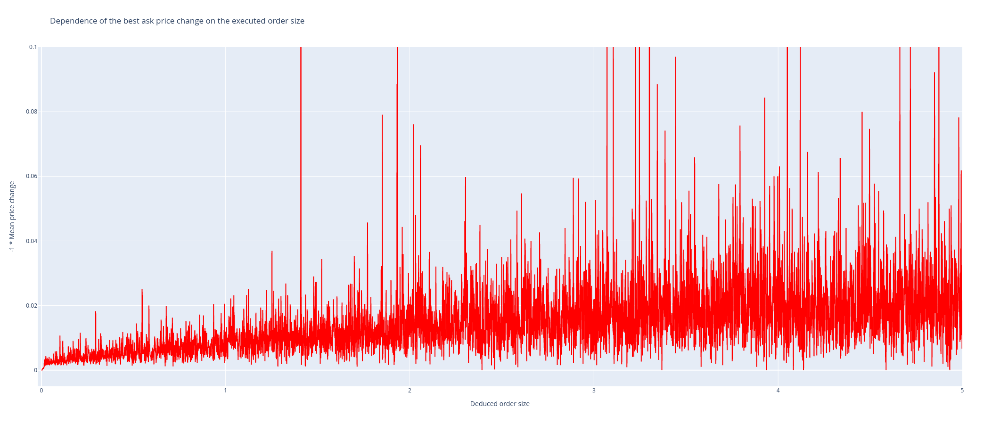

In [36]:
%%capture --no-display
fig = go.Figure(go.Line(
    x = lob_pierces_ask.index * 0.001,
    y = lob_pierces_ask['price_change']*-1,
    line=dict(color='red'),
    hovertemplate = 'Order size: %{x}<br>Price change: %{y}<extra></extra>'
))
fig.update_layout(xaxis_title='Deduced order size', yaxis_title='-1 * Mean price change',
                  title='Dependence of the best ask price change on the executed order size',
                  width=1300, height=900, showlegend=False)
fig.update_xaxes(range=[-0.02, 5])
fig.update_yaxes(range=[-0.005, 0.1])


The behaviour of this dependency behaves in the same way as for BTC.